In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/train-dataset3/elon_uncle2.jpg
/kaggle/input/train-dataset3/elon_uncle.jpg
/kaggle/input/train-dataset3/elon_uncle_3.jpg
/kaggle/input/losses/adagrad_losses_500_lr1.txt
/kaggle/input/losses/rms_losses_500_lr1.txt
/kaggle/input/losses/adam_losses_500_lr1.txt
/kaggle/input/losses-all/rms_500_lr3.png
/kaggle/input/losses-all/adam_100_lr1.png
/kaggle/input/losses-all/rms_500_lr1.png
/kaggle/input/losses-all/adam_losses_100_lr1.txt
/kaggle/input/losses-all/rms_losses_100_lr1.txt
/kaggle/input/losses-all/adagrad_losses_50_lr1.txt
/kaggle/input/losses-all/adagrad_losses_500_lr1.txt
/kaggle/input/losses-all/adagrad_losses_50_lr2.txt
/kaggle/input/losses-all/rms_losses_500_lr1.txt
/kaggle/input/losses-all/adagrad_losses_100_lr1.txt
/kaggle/input/losses-all/adam_losses_50_lr1.txt
/kaggle/input/losses-all/rms_100_lr1.png
/kaggle/input/losses-all/adam_500_lr1.png
/kaggle/input/losses-all/rms_losses_500_lr3.txt
/kaggle/input/losses-all/adagrad_50_lr1.png
/kaggle/input/losses-all/adagr

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [12]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
# os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [13]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

Display and Load Image

In [5]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [6]:
# style_path= '/kaggle/input/nst-ds/Kaggle_input/Starry_Night.jpg'
# content_path= '/kaggle/input/nst-ds/Kaggle_input/dog.png'

content_path= '/kaggle/input/train-dataset3/elon_uncle2.jpg'
style_path= '/kaggle/input/trial-dataset/style_image3.jpg'

In [7]:
def load_img(path_to_img, width=512, height=512):
    img = tf.image.decode_image(tf.io.read_file(path_to_img), channels=3)
    img = tf.image.resize(img, [width, height])
    img = tf.cast(img, tf.float32) / 255.0
    img = tf.expand_dims(img, axis=0)

    return img

In [8]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

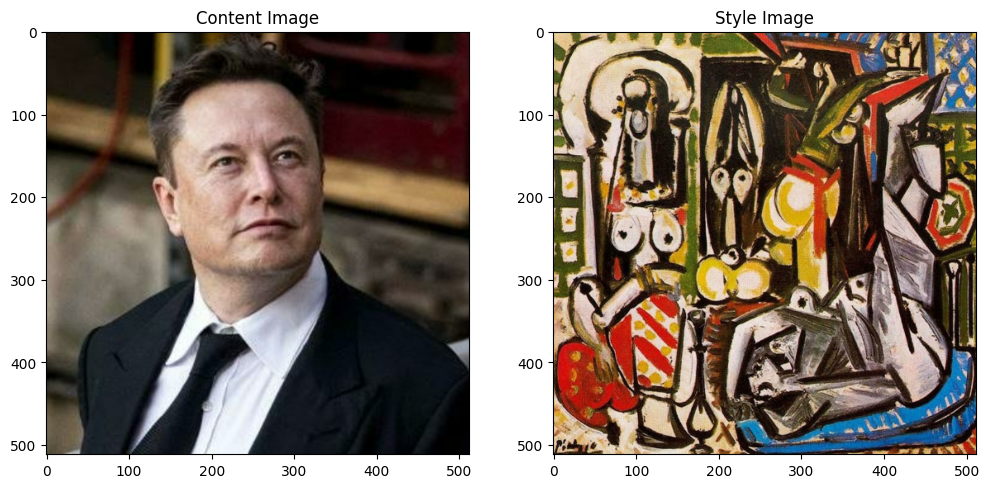

In [9]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

Define layers

In [10]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

Model definition

In [2]:
def vgg_layers(layer_names):
  print(layer_names)
  # Load model
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  # We only need feature extraction
  vgg.trainable = False
  # Get Outputs for layer names specified in the model
  outputs = [vgg.get_layer(name).output for name in layer_names]
  # New model with specified layers only
  model = tf.keras.Model([vgg.input], outputs)
  # Model summary
  print(model.summary())

  return model

['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 12,944,960 (49.38 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 12,944,960 (49.38 MB)

None


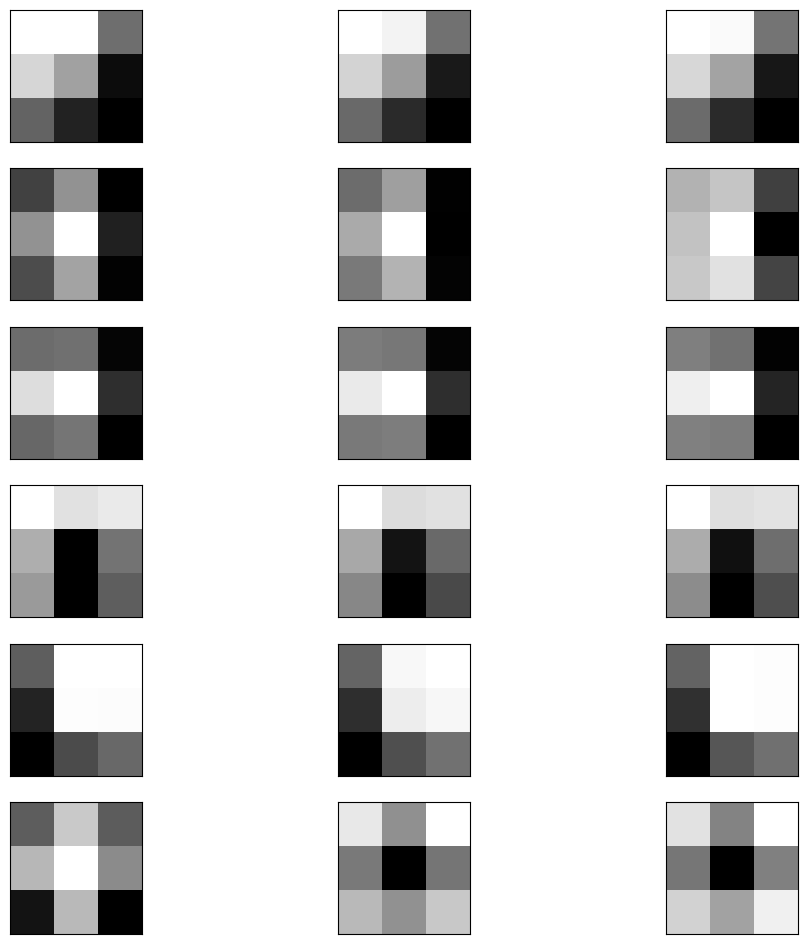

In [12]:
model = vgg_layers(style_layers)
filters, biases = model.layers[1].get_weights()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)
n_filters, ix = 6, 1
for i in range(n_filters):
    # get the filter
    f = filters[:, :, :, i]
    # plot each channel separately
    for j in range(3):
        # specify subplot and turn of axis
        ax = plt.subplot(n_filters, 3, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # ax.set_xlabel()
        # plot filter channel in grayscale
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
plt.show()

# Visualize Feature maps

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


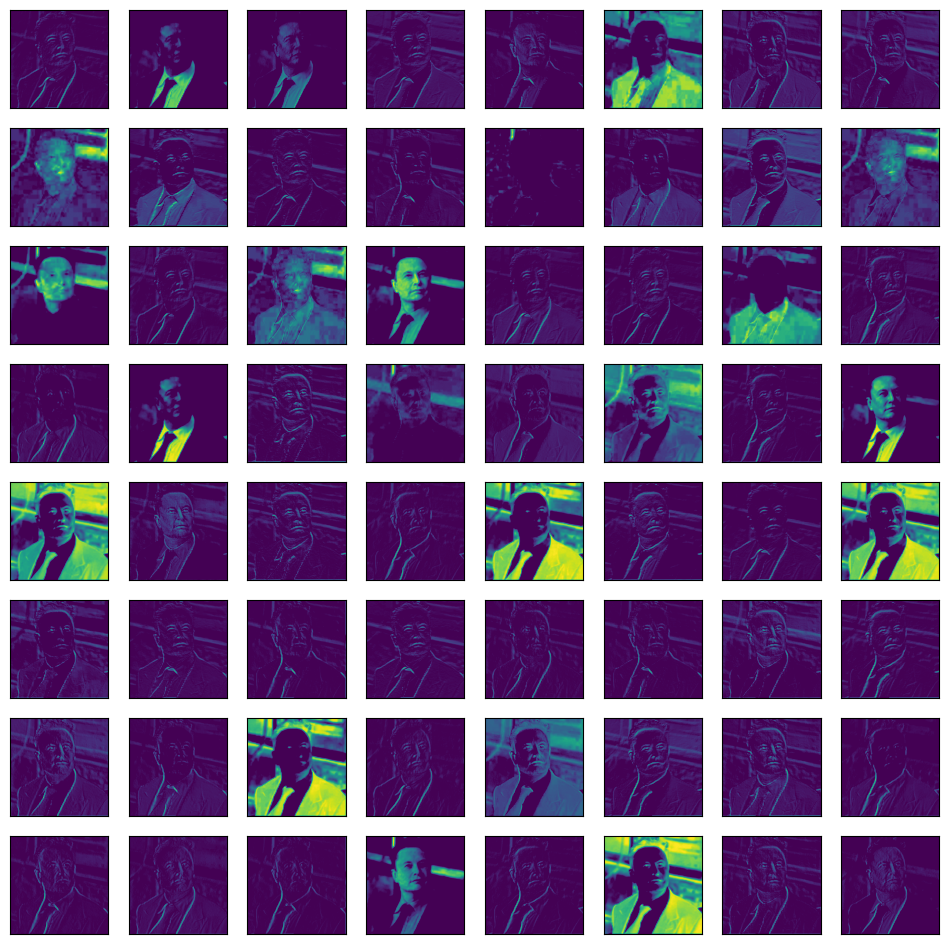

In [30]:
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims

model = VGG19()
model = Model(inputs=model.inputs, outputs=model.layers[1].output)
img = load_img(content_path, target_size=(224, 224))
img = img_to_array(img)
img = expand_dims(img, axis=0)
img = preprocess_input(img)
# get feature map
feature_maps = model.predict(img)

square = 8
ix = 1
for _ in range(square):
    for _ in range(square):
        ax = pyplot.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_maps[0, :, :, ix-1])
        ix += 1
pyplot.show()

Style Layer Outputs:<br>

*   Extract Model Output
*   Display output statistics




In [14]:
style_extractor = vgg_layers(style_layers) # model
style_outputs = style_extractor(style_image*255) # feature map

#Layer output stats
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 12,944,960 (49.38 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 12,944,960 (49.38 MB)

None
block1_conv1
  shape:  (1, 512, 512, 64)
  min:  0.0
  max:  787.9692
  mean:  32.044582

block2_conv1
  shape:  (1, 256, 256, 128)
  min:  0.0
  max:  3851.9749
  mean:  201.86465

block3_conv1
  shape:  (1, 128, 128, 256)
  min:  0.0
  max:  9760.138
  mean:  224.10146

block4_conv1
  shape:  (1, 64, 64, 512)
  min:  0.0
  max:  21397.906
  mean:  754.0809

block5_conv1
  shape:  (1, 32, 32, 512)
  min:  0.0
  max:  3563.4272
  mean:  58.12673



Loss Functions

In [15]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [16]:
style_weight=1e-2
content_weight=1e4

In [17]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [18]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    # Normalize inputs
    inputs = inputs*255.0
    # Preproces inputs
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]
    # dict of content layer names and corresponding outputs
    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}
    # dict of style layer names and corresponding outputs
    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [19]:
extractor = StyleContentModel(style_layers, content_layers) # Initializes the model

results = extractor(tf.constant(content_image)) # Processes the image through the VGG net

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())


['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1', 'block5_conv2']


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 15,304,768 (58.38 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 15,304,768 (58.38 MB)

None
Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0142280655
    max:  32858.992
    mean:  364.07364

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  41971.188
    mean:  9143.194

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  213924.2
    mean:  8354.696

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  2509585.8
    mean:  148746.38

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  99983.52
    mean:  1165.4377

Contents:
   block5_conv2
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  1212.312
    mean:  12.806341


Extract Style and Content Targets
<br>These lines extract style and content features from the style and content images using the extractor model, storing them as target representations.

In [20]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [9]:
# Initializes the image
image = tf.Variable(content_image)

Clip Values

In [22]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Train function using Gradient Tape

In [23]:
@tf.function()
def train_step(image,opt):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

  return loss, image

Run Optimizer and plot loss

In [24]:
def run_optimizer(opt, image, epochs, steps_per_epoch):
  losses = []
  result_image= None
  start = time.time()
  step = 0
  for n in range(epochs):
    epoch_losses=[]

    for m in range(steps_per_epoch):
      step += 1
      loss, result_image = train_step(image,opt)
      # losses.append(loss)
      epoch_losses.append(loss)
      print(".", end='', flush=True)
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))
    print("Train step: {}".format(step))
    epoch_mean_loss = tf.reduce_mean(epoch_losses)
    losses.append(epoch_mean_loss)
    # losses.extend(epoch_losses)
    
  end = time.time()
  print("Total time: {:.1f}".format(end-start))

  return losses, result_image

In [30]:
# multiple losses
def plot_all_losses(losses,epochs):
  plt.figure(figsize=(16, 8))
  for opt, loss_list in losses.items():
      plt.plot(range(1, epochs + 1), loss_list, label=opt)
  plt.xlabel('Epoch')
  plt.ylabel('Mean Loss')
  plt.title('Mean Loss per Epoch')
  plt.legend()
  plt.show()

In [31]:
def plot_single_loss(losses,epochs):
    plt.plot(range(1, epochs+1), losses, label='Mean Loss per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Mean Loss')
    plt.title('Mean Loss per Epoch')
    plt.legend()
    plt.show()

Save losses

In [32]:
# File write
def save_losses(losses, optimizer, dir_l="/kaggle/working/losses"):
    file_path = dir_l
    if os.path.exists(file_path):
        print("The file exists in the directory.")
    else:
        print("The file does not exist in the directory.")
        os.makedirs(file_path)
    with open(file_path+"/"+optimizer+".txt", "w") as file:
    #     file.write(content)
        for loss_value in losses:
                file.write(str(loss_value) + '\n')

In [33]:
# l=[1,2,3,4,5]
# save_losses(l,"adam")

In [34]:
# os.makedirs("/kaggle/working/images/adam")
# os.makedirs("/kaggle/working/images/adagrad")
# os.makedirs("/kaggle/working/images/lbfgs")

Save Images


In [35]:
def save_styled_image(image, optimizer, save_dir='/kaggle/working/images'):
    file_path = save_dir
    if os.path.exists(file_path):
        print("The file exists in the directory.")
    else:
        print("The file does not exist in the directory.")
        os.makedirs(file_path)
    styled_image = tensor_to_image(image)
    styled_image.save(f'{file_path}/{optimizer}.png')
    print("File saved")

In [36]:
def save_plot_image(image, name, save_dir='/kaggle/working/plots'):
    file_path = save_dir
    if os.path.exists(file_path):
        print("The file exists in the directory.")
    else:
        print("The file does not exist in the directory.")
        os.makedirs(file_path)
    styled_image = tensor_to_image(image)
    styled_image.save(f'{file_path}+/+{name}+.png')
    print("File saved")

In [37]:
# save_styled_image(content_image, "lbfgs")

Read saved losses 

In [43]:
# Define a function to extract loss values from the text file
def read_loss_from_file(file_path):
    loss_values = []
    with open(file_path, 'r') as file:
        for line in file:
            # Extract the loss value from each line
            loss_values.append(tf.constant(float(line.split(',')[0].split('(')[1])))
    return loss_values

# File path to your text file
# file_path = 'your_file_path.txt'  # Update with the correct file path

# Read loss values from the file
# loss_values = read_loss_from_file("/kaggle/working/losses/adam_50.txt")

# # Print the extracted loss values
# print("Loss Values:")
# print(loss_values)

Adam with 50 epochs and LR=0.02

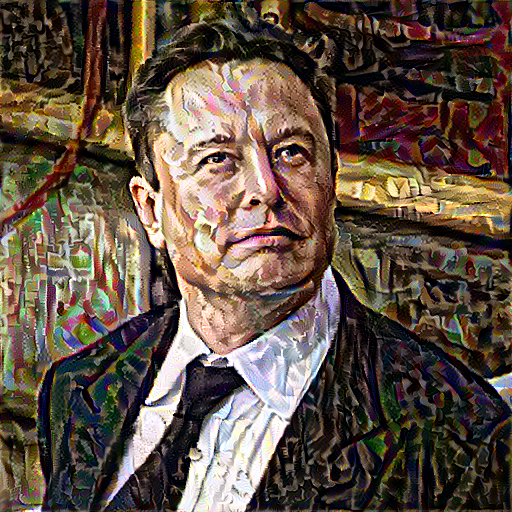

Train step: 250
Total time: 30.6


In [34]:
# Adam Optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

# Run the optimizer
adam_losses_50_lr1, adam_50_lr1=run_optimizer(optimizer, image_variable, epochs=50, steps_per_epoch=5)

In [35]:
save_losses(adam_losses_50_lr1, "adam_losses_50_lr1")
save_styled_image(adam_50_lr1, "adam_50_lr1")

The file does not exist in the directory.
The file does not exist in the directory.
File saved


Adagrad with 50 epochs and LR=0.02

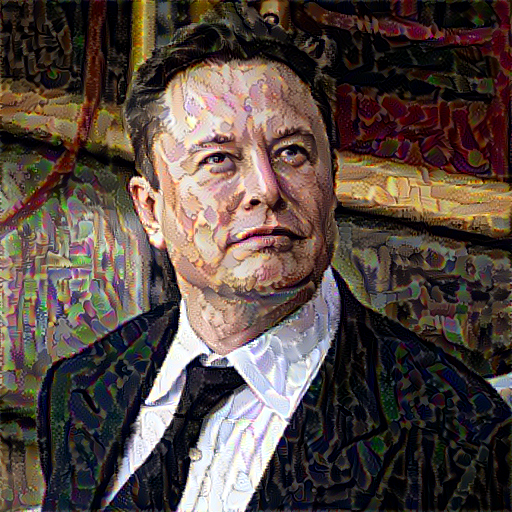

Train step: 250
Total time: 30.4


In [52]:
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

adagrad_losses_50_lr1, adagrad_50_lr1=run_optimizer(optimizer, image_variable, epochs=50, steps_per_epoch=5)

In [55]:
# save losses and image for adagrad lr=0.02 and epochs=50
save_losses(adagrad_losses_50_lr1, "adagrad_losses_50_lr1")
save_styled_image(adagrad_50_lr1, "adagrad_50_lr1")

The file exists in the directory.
The file exists in the directory.
File saved


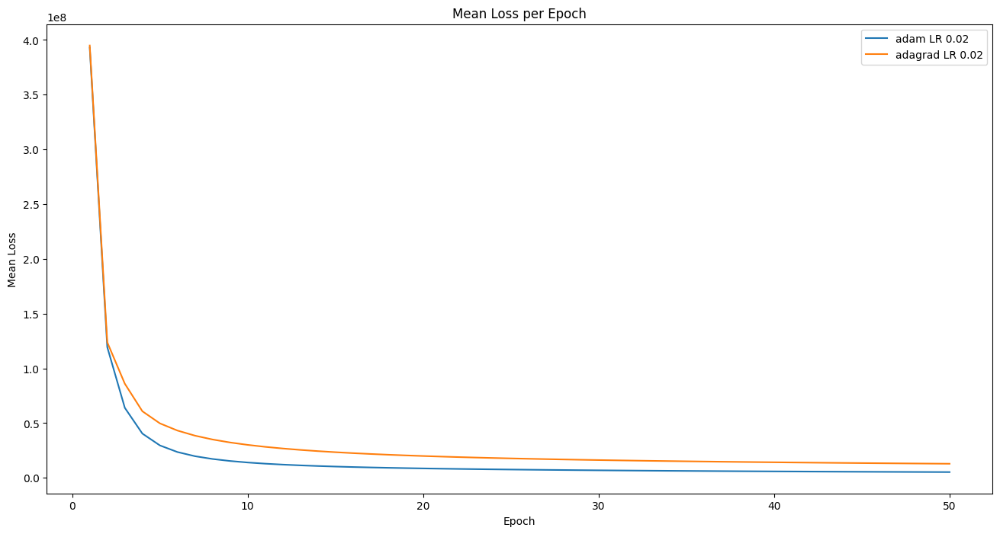

In [56]:
# plot loss for Adagrad and Adam with LR=0.02 and epochs 50

plot_all_losses({'adam LR 0.02': adam_losses_50_lr1, 'adagrad LR 0.02': adagrad_losses_50_lr1},50)

Adagrad with 50 epochs and Lr=0.1

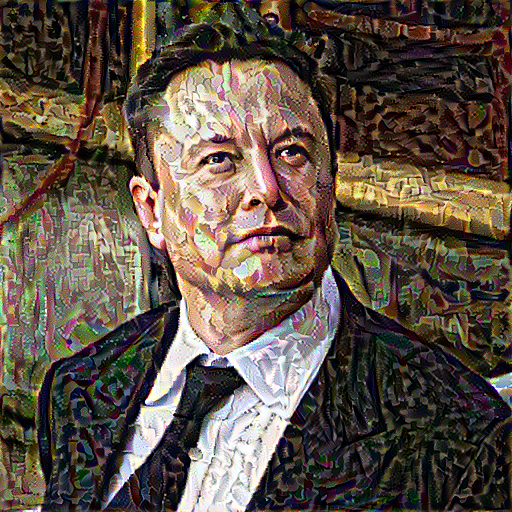

Train step: 250
Total time: 30.2


In [60]:
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.1)

content_image = image
image_variable = tf.Variable(content_image)

adagrad_losses_50_lr2, adagrad_50_lr2=run_optimizer(optimizer, image_variable, epochs=50, steps_per_epoch=5)

In [62]:
# save losses and image for adagrad lr=0.1 and epochs=50
save_losses(adagrad_losses_50_lr1, "adagrad_losses_50_lr2")
save_styled_image(adagrad_50_lr1, "adagrad_50_lr2")

The file exists in the directory.
The file exists in the directory.
File saved


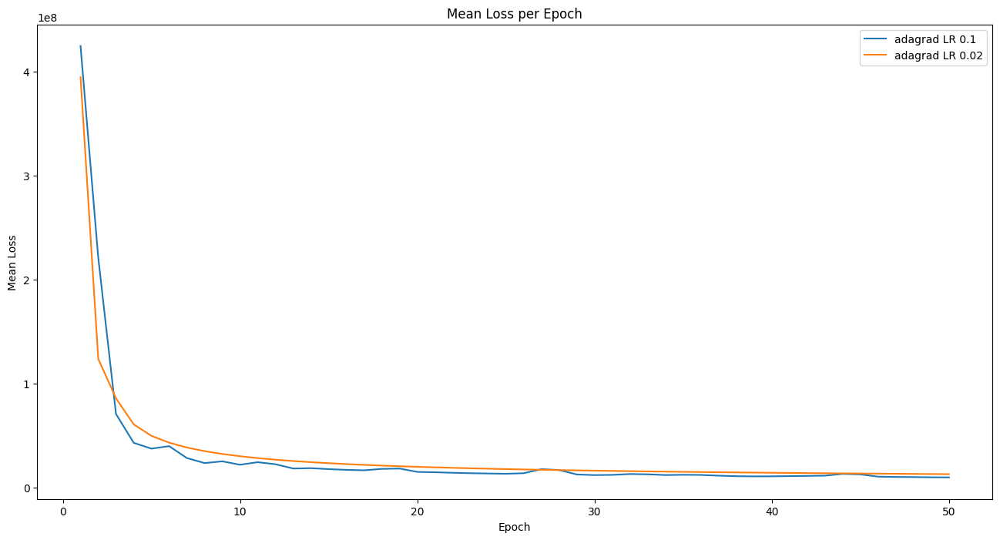

In [63]:
plot=plot_all_losses({'adagrad LR 0.1': adagrad_losses_50_lr2, 'adagrad LR 0.02': adagrad_losses_50_lr1},50)

100 epochs and LR=0.02

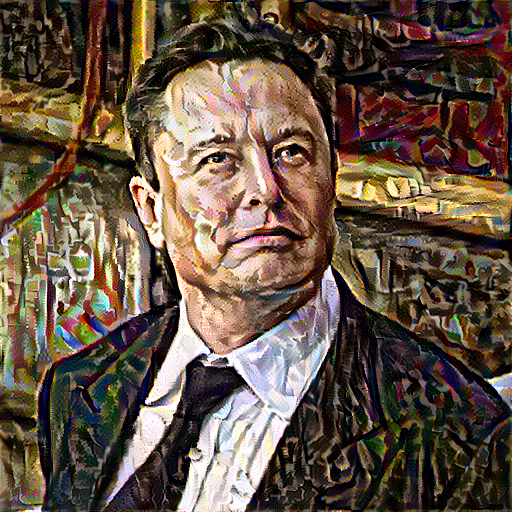

Train step: 500
Total time: 58.0


In [66]:
optimizer= tf.keras.optimizers.Adam(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

adam_losses_100_lr1, adam_100_lr1=run_optimizer(optimizer, image_variable, epochs=100, steps_per_epoch=5)

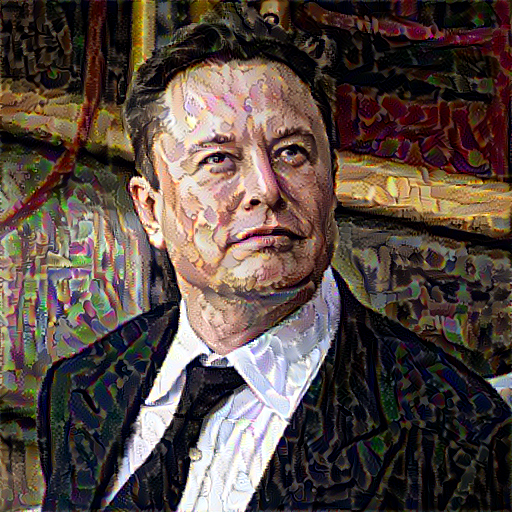

Train step: 500
Total time: 58.1


In [69]:
optimizer= tf.keras.optimizers.Adagrad(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

adagrad_losses_100_lr1, adagrad_100_lr1=run_optimizer(optimizer, image_variable, epochs=100, steps_per_epoch=5)

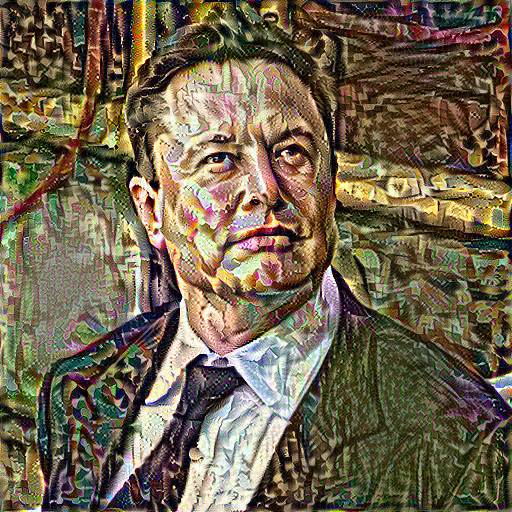

Train step: 500
Total time: 57.2


In [72]:
optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

rms_losses_100_lr1, rms_100_lr1=run_optimizer(optimizer, image_variable, epochs=100, steps_per_epoch=5)

In [73]:
# save losses and image for adagrad lr=0.02 and epochs=50
save_losses(adagrad_losses_100_lr1, "adagrad_losses_100_lr1")
save_styled_image(adagrad_100_lr1, "adagrad_100_lr1")
save_losses(adam_losses_100_lr1, "adam_losses_100_lr1")
save_styled_image(adam_100_lr1, "adam_100_lr1")
save_losses(rms_losses_100_lr1, "rms_losses_100_lr1")
save_styled_image(rms_100_lr1, "rms_100_lr1")

The file exists in the directory.
The file exists in the directory.
File saved
The file exists in the directory.
The file exists in the directory.
File saved
The file exists in the directory.
The file exists in the directory.
File saved


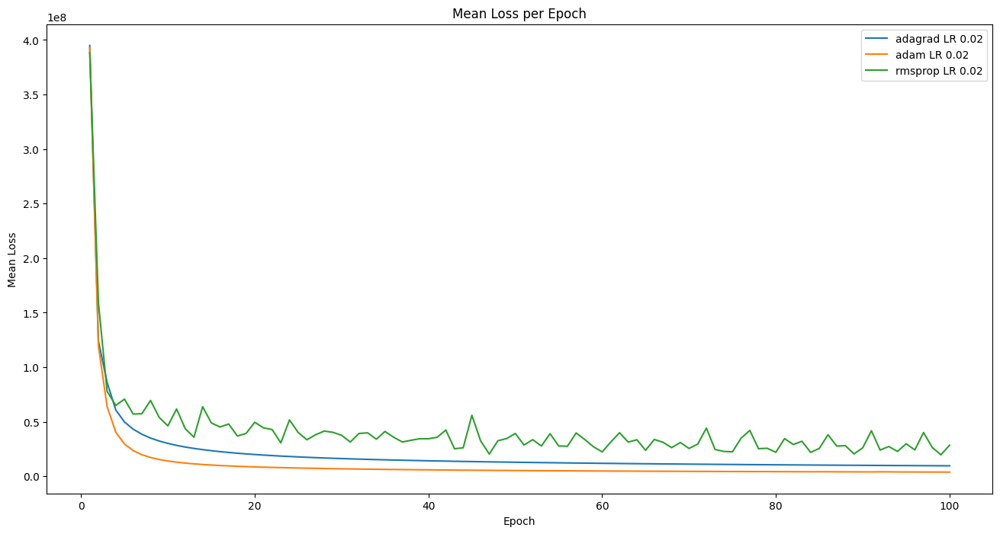

In [74]:
plot=plot_all_losses({'adagrad LR 0.02': adagrad_losses_100_lr1, 'adam LR 0.02': adam_losses_100_lr1, 'rmsprop LR 0.02': rms_losses_100_lr1},100)

500 epochs LR=0.02

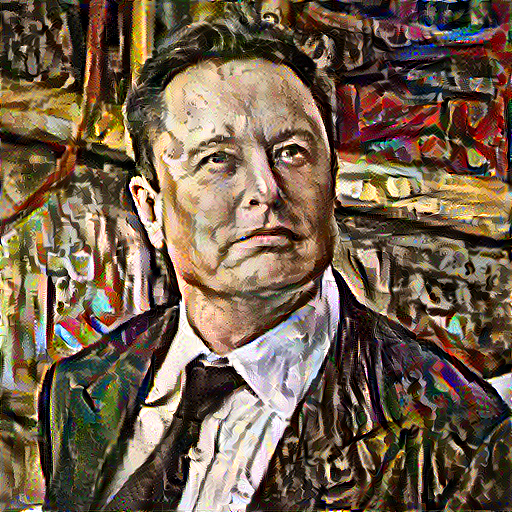

Train step: 2500
Total time: 151.6


In [29]:
optimizer= tf.keras.optimizers.Adam(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

adam_losses_500_lr1, adam_500_lr1=run_optimizer(optimizer, image_variable, epochs=500, steps_per_epoch=5)

In [30]:
save_losses(adam_losses_500_lr1, "adam_losses_500_lr1")
save_styled_image(adam_500_lr1, "adam_500_lr1")

The file does not exist in the directory.
The file does not exist in the directory.
File saved


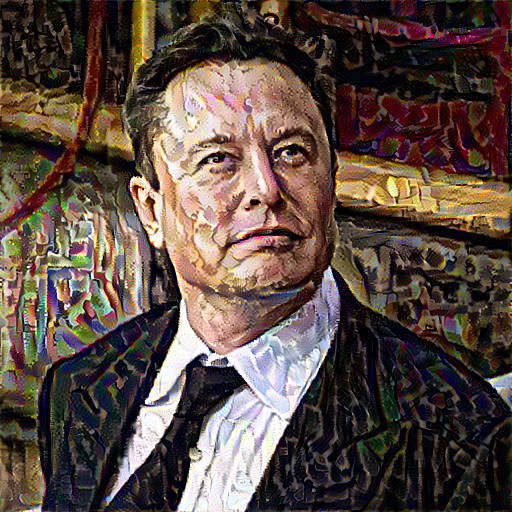

Train step: 2500
Total time: 151.8


In [46]:
optimizer= tf.keras.optimizers.Adagrad(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

adagrad_losses_500_lr1, adagrad_500_lr1=run_optimizer(optimizer, image_variable, epochs=500, steps_per_epoch=5)

In [47]:
save_losses(adagrad_losses_500_lr1, "adagrad_losses_500_lr1")
save_styled_image(adagrad_500_lr1, "adagrad_500_lr1")

The file does not exist in the directory.
The file does not exist in the directory.
File saved


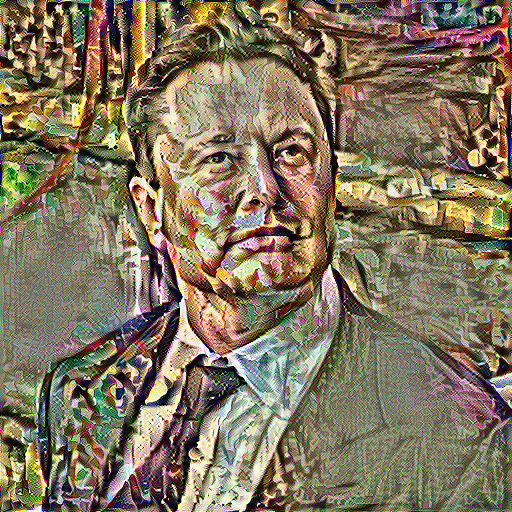

Train step: 2500
Total time: 149.6


In [40]:
optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.02)

content_image = image
image_variable = tf.Variable(content_image)

rms_losses_500_lr1, rms_500_lr1=run_optimizer(optimizer, image_variable, epochs=500, steps_per_epoch=5)

In [41]:
save_losses(rms_losses_500_lr1, "rms_losses_500_lr1")
save_styled_image(rms_500_lr1, "rms_500_lr1")

The file does not exist in the directory.
The file does not exist in the directory.
File saved


In [ ]:
# loading losses


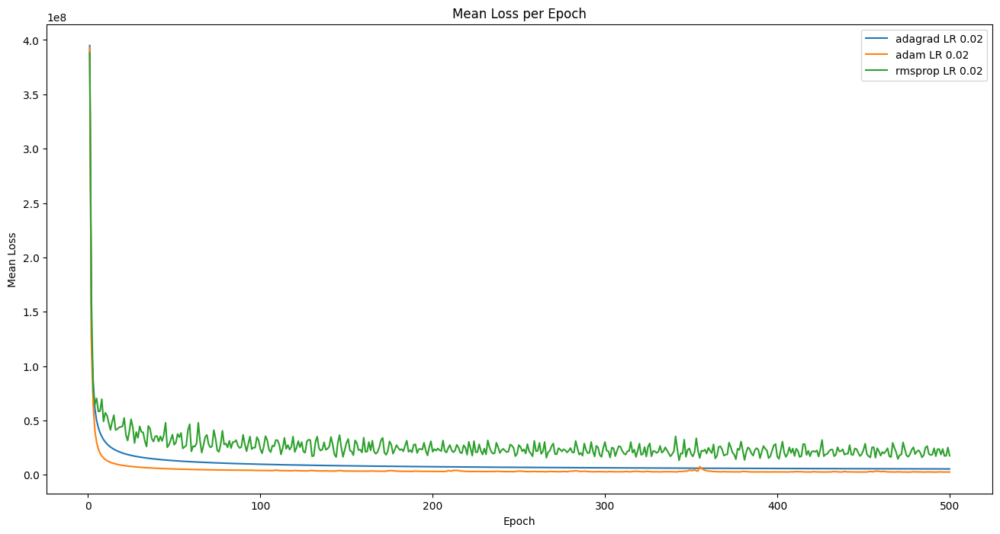

In [48]:
plot_all_losses({'adagrad LR 0.02': adagrad_losses_500_lr1, 'adam LR 0.02': adam_losses_500_lr1, 'rmsprop LR 0.02': rms_losses_500_lr1},500)

Reducing LR for RMSProp further reduces noise in the gradient and gives better results

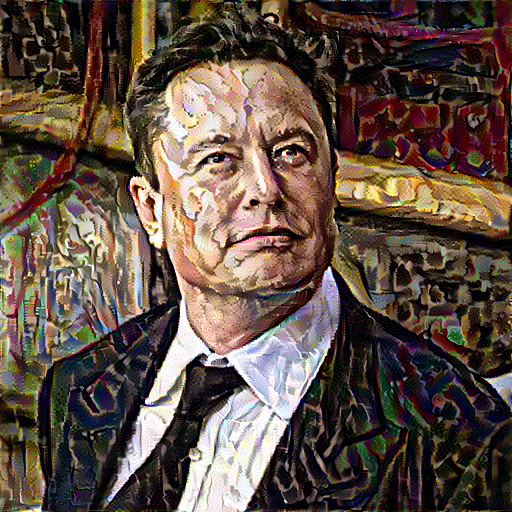

Train step: 2500
Total time: 152.9


In [38]:
optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.001)

content_image = image
image_variable = tf.Variable(content_image)

rms_losses_500_lr3, rms_500_lr3=run_optimizer(optimizer, image_variable, epochs=500, steps_per_epoch=5)

In [39]:
save_losses(rms_losses_500_lr3, "rms_losses_500_lr3")
save_styled_image(rms_500_lr3, "rms_500_lr3")

The file does not exist in the directory.
The file does not exist in the directory.
File saved


In [45]:
adam_losses_100_lr1 = read_loss_from_file("/kaggle/input/losses-all/adam_losses_100_lr1.txt")
adagrad_losses_100_lr1 = read_loss_from_file("/kaggle/input/losses-all/adagrad_losses_100_lr1.txt")
rms_losses_100_lr1= read_loss_from_file("/kaggle/input/losses-all/rms_losses_100_lr1.txt")

In [46]:
adam_losses_500_lr1 = read_loss_from_file("/kaggle/input/losses-all/adam_losses_500_lr1.txt")
adagrad_losses_500_lr1 = read_loss_from_file("/kaggle/input/losses-all/adagrad_losses_500_lr1.txt")
rms_losses_500_lr1= read_loss_from_file("/kaggle/input/losses-all/rms_losses_500_lr1.txt")
rms_losses_500_lr3= read_loss_from_file("/kaggle/input/losses-all/rms_losses_500_lr3.txt")

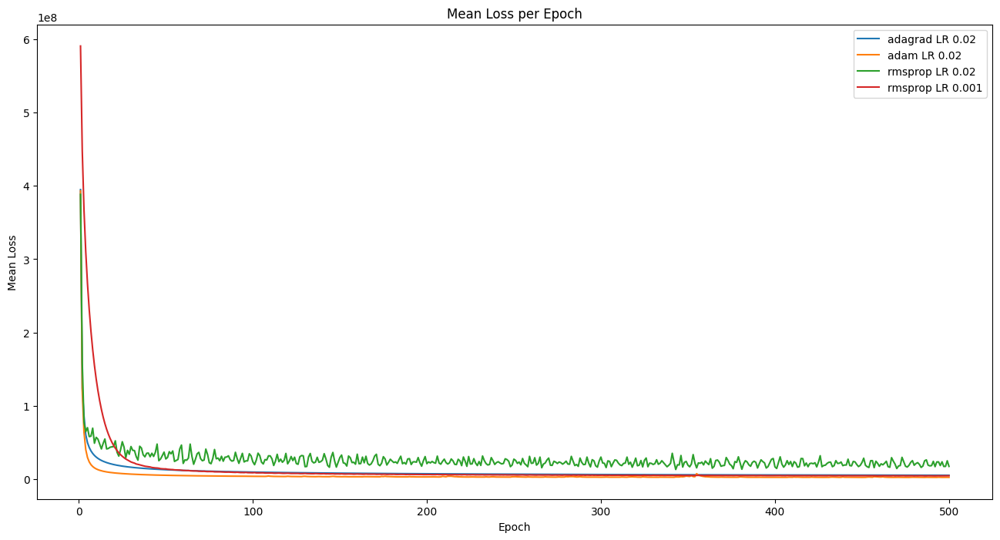

In [47]:
plot_all_losses({'adagrad LR 0.02': adagrad_losses_500_lr1, 'adam LR 0.02': adam_losses_500_lr1, 'rmsprop LR 0.02': rms_losses_500_lr1, 'rmsprop LR 0.001': rms_losses_500_lr3},500)

Summary table

In [50]:

import pandas as pd
losses_all=[np.array(adam_losses_100_lr1[-1]),np.array(adagrad_losses_100_lr1[-1]),np.array(rms_losses_100_lr1[-1]),np.array(adam_losses_500_lr1[-1]),np.array(adagrad_losses_500_lr1[-1]),np.array(rms_losses_500_lr1[-1]),np.array(rms_losses_500_lr3[-1])]
table_data = {'Optimizer':['adam','adagrad','rmsprop','adam','adagrad','rmsprop','rmsprop'],'learning rate':[0.02,0.02,0.02,0.02,0.02,0.02,0.001], 'Epochs':[100,100,100,500,500,500,500], 'Final Loss': losses_all}
df = pd.DataFrame(table_data)
df

,Optimizer,learning rate,Epochs,Final Loss
0,adam,0.020,100,3892528.5
1,adagrad,0.020,100,9648204.0
2,rmsprop,0.020,100,28531952.0
3,adam,0.020,500,2505560.5
4,adagrad,0.020,500,5350237.5
5,rmsprop,0.020,500,17474926.0
6,rmsprop,0.001,500,4661754.0


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('input_image.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Laplacian filter
laplacian = cv2.Laplacian(image, cv2.CV_64F)

# Convert the result to uint8 (unsigned integer 8-bit)
laplacian = np.uint8(np.absolute(laplacian))

# Plot the original and Laplacian filtered image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('High Frequency Components (Laplacian)')
plt.axis('off')

plt.show()

LBFGS:

In [15]:
style_path= '/kaggle/input/nst-ds/Kaggle_input/Starry_Night.jpg'
content_path= '/kaggle/input/nst-ds/Kaggle_input/dog.png'

content_image = load_img(content_path)
style_image = load_img(style_path)

In [16]:
def display_lbfgs_image(tensor):
    tensor = torch.clamp(tensor, 0, 1)
    image = transforms.ToPILImage()(tensor.squeeze(0))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    return image

In [17]:
import torch
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt


def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])
    return preprocess(image).unsqueeze(0)

# Load content and style images
# content_path = '/content/Starry_Night.jpg'
# style_path = '/content/dog.png'

content_image = load_image(content_path)
style_image = load_image(style_path)

# Define the VGG19 model and set requires_grad to False for its parameters
vgg19 = models.vgg19(weights=True).features.eval()
for param in vgg19.parameters():
    param.requires_grad_(False)

# Define the input image that you want to optimize
input_image = content_image.clone().requires_grad_(True)

# Define the loss function, optimizer, and weights
content_loss = torch.nn.functional.mse_loss
style_loss = torch.nn.functional.mse_loss

style_weight=1
content_weight=1

# Function to calculate gram matrix
def gram_matrix(input):
    if input.dim() == 4:  # Batched input
        batch_size, channels, height, width = input.size()
        features = input.view(batch_size * channels, height * width)
    elif input.dim() == 3:  # Single image input
        channels, height, width = input.size()
        features = input.view(channels, height * width)
    else:
        raise ValueError("Input tensor must have either 3 or 4 dimensions.")

    gram_matrix = torch.mm(features, features.t())
    return gram_matrix.div(features.size(0))


# optimizer_names = ['Adam', 'Adagrad', 'LBFGS']
# losses = {optimizer_name: [] for optimizer_name in optimizer_names}
lbfgs_losses=[]
# Define the closure function for LBFGS optimizer
def closure_lbfgs():
    optimizer_lbfgs.zero_grad()

    # Forward pass to compute the style and content losses
    input_image_features = vgg19(input_image)
    content_image_features = vgg19(content_image)
    style_image_features = vgg19(style_image)

    content_loss_value = content_loss(input_image_features, content_image_features)
    style_loss_value = 0.0

    for input_feature, style_feature in zip(input_image_features, style_image_features):
        input_gram_matrix = gram_matrix(input_feature)
        style_gram_matrix = gram_matrix(style_feature)
        style_loss_value += style_loss(input_gram_matrix, style_gram_matrix)
        
    

    total_loss = content_weight * content_loss_value + style_weight * style_loss_value

    # Backward pass to compute gradients
    total_loss.backward()

    return total_loss

# Function to run LBFGS optimization
def run_optimizer_lbfgs(optimizer, closure, num_iterations):
    for iteration in range(num_iterations):
        loss = optimizer.step(closure)
#         losses[optimizer_name].append(loss.item())
        lbfgs_losses.append(loss.item())
        print(f"Iteration: {iteration+1}, Loss ({optimizer_name}): {loss.item()}")

# Optimizer: LBFGS
optimizer_name = 'LBFGS'
optimizer_lbfgs = optim.LBFGS([input_image])
run_optimizer_lbfgs(optimizer_lbfgs, closure_lbfgs, num_iterations=10)

Iteration: 1, Loss (LBFGS): 0.007476266007870436
Iteration: 2, Loss (LBFGS): 0.0073160757310688496
Iteration: 3, Loss (LBFGS): 0.0073120188899338245
Iteration: 4, Loss (LBFGS): 0.007309759501367807
Iteration: 5, Loss (LBFGS): 0.007308175787329674
Iteration: 6, Loss (LBFGS): 0.007307050749659538
Iteration: 7, Loss (LBFGS): 0.0073064467869699
Iteration: 8, Loss (LBFGS): 0.007306003011763096
Iteration: 9, Loss (LBFGS): 0.00730558717623353
Iteration: 10, Loss (LBFGS): 0.007305198349058628


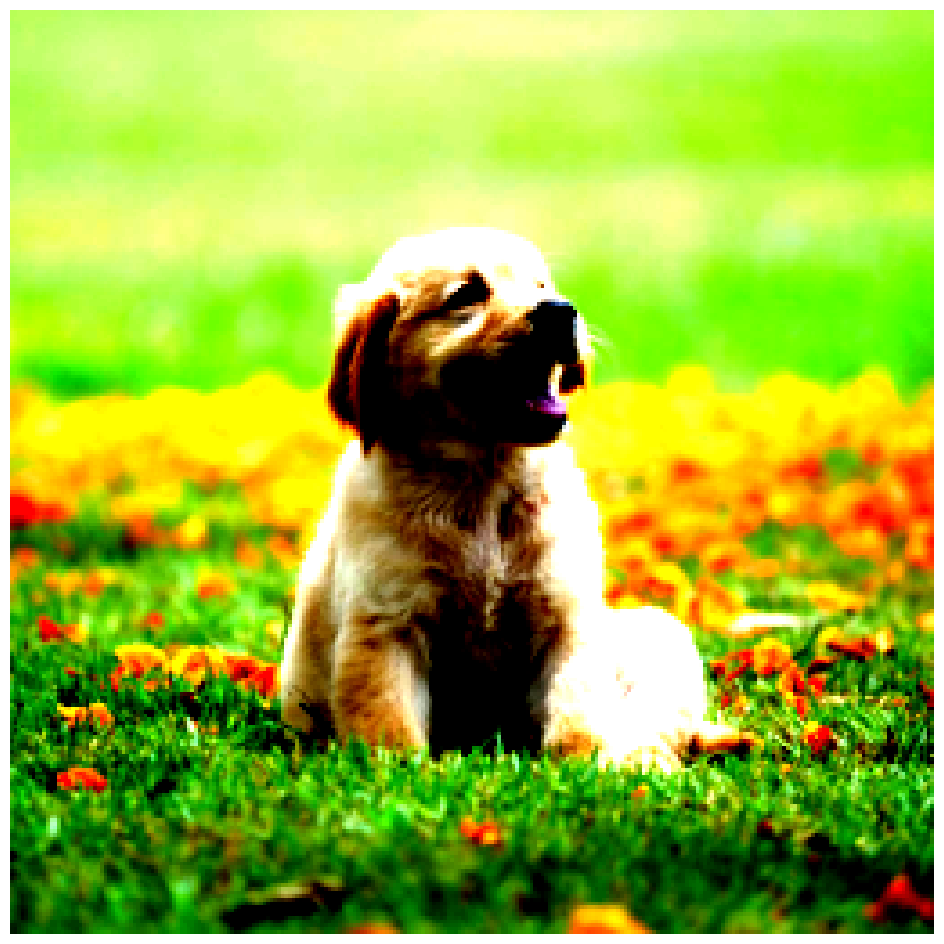

In [18]:
lbfgs_image=display_lbfgs_image(input_image)

In [ ]:
save_losses(lbfgs_losses, "lbfgs_losses_50")
save_styled_image(lbfgs_image, "lbfgs_50")

Plot LBFGS loss

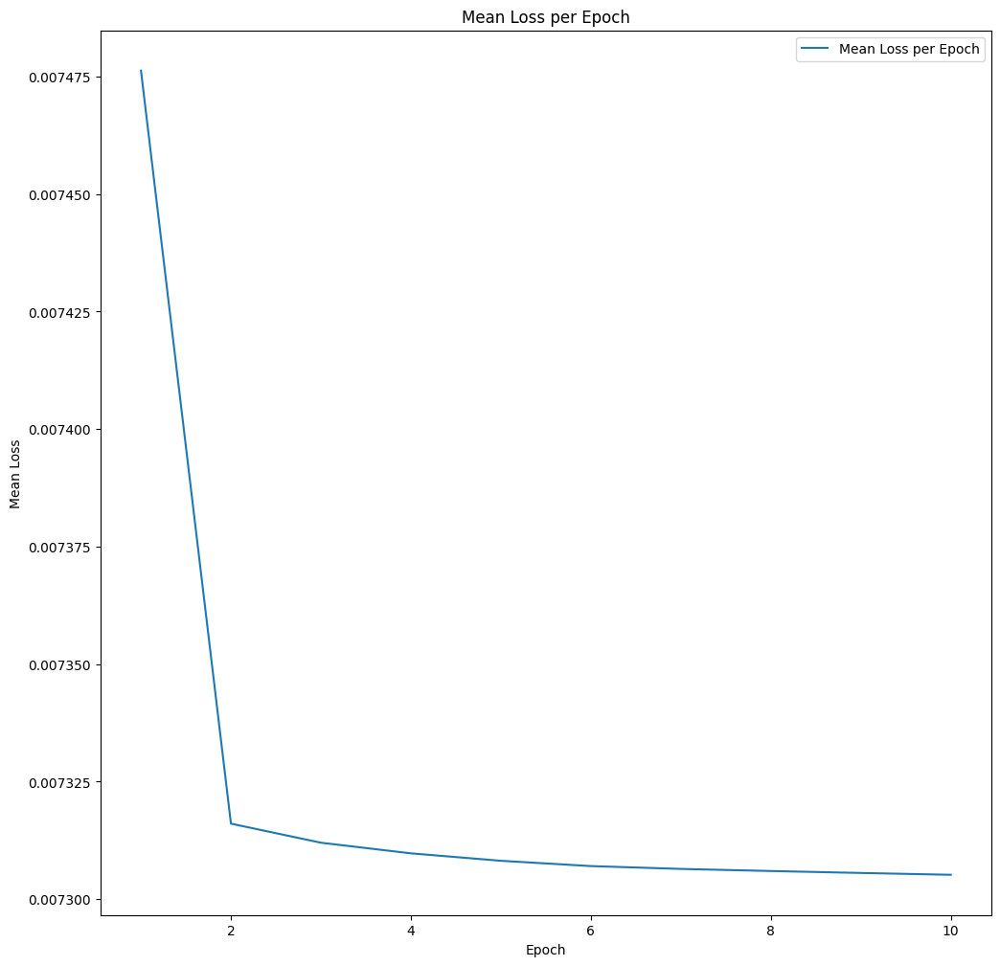

In [24]:
  plt.plot(range(1, 10+1), lbfgs_losses, label='Mean Loss per Epoch')
  plt.xlabel('Epoch')
  plt.ylabel('Mean Loss')
  plt.title('Mean Loss per Epoch')
  plt.legend()
  plt.show()

In [ ]:
# # Plot the loss curves
# plt.figure(figsize=(10, 6))
# for optimizer_name in optimizer_names:
#     plt.plot(losses[optimizer_name], label=optimizer_name)

# plt.title('Loss Over Iterations for Different Optimizers')
# plt.xlabel('Iteration')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()
